In [1]:
import numpy as np
import scipy as sp
import scipy.signal as sig
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers, regularizers, callbacks
from sklearn.decomposition import PCA
from data_wrangling.datamanager import DataLoader

In [2]:
dl = DataLoader()
data = dl.get_fcx2(['s1'])

In [3]:
X1 = data['s1']['data']
mn = X1.mean(0).reshape((1, -1))
st = X1.std (0).reshape((1, -1))
X1 = (X1 - mn) / st
X1.shape

(1303952, 73)

In [4]:
fs = 1000

idxs_train_test_split = int(len(X1) * 0.7)

t_in  = 0.5
t_out = 5e-3

p_in  = int(fs * t_in)
p_out = int(fs * t_out)

step  = int(fs * 2e-2) 

idxs_train = np.arange(0, idxs_train_test_split - p_out - p_in, step)

X_train = np.stack([
    X1[idx : idx + p_in]
    for idx in idxs_train
])

Y_train = np.stack([
    X1[idx + p_in : idx + p_in + p_out]
    for idx in idxs_train
])

X_train.shape, Y_train.shape

((45614, 500, 73), (45614, 5, 73))

In [5]:
def make_model_architecture_1(
    X, Y,
    
    dense_pre_n_layers,
    dense_pre_n_units,
    
    bidirectional_encoder_n_layers,
    bidirectional_encoder_n_units,
    
    dense_mid_n_layers,
    dense_mid_n_units,
    
    lstm_decoder_n_units,
    
    bidirectional_decoder_n_layers,
    bidirectional_decoder_n_units,
    
    dense_post_n_layers,
    dense_post_n_units
):
    '''
        Architecture:
        
        X (input) shape (n timesteps in, n channels)
        
        dense_pre_n_layers number of:
            Dense(dense_pre_n_units)
            BatchNormalization
            ReLU
            
        (bidirectional_encoder_n_layers - 1) number of:
            Bidirectional(
                LSTM(
                    bidirectional_encoder_n_units,
                    return_sequences = True
                )
            )
            
        Bidirectional(
            LSTM(
                bidirectional_encoder_n_units,
                return_sequences = False
            )
        )
            
        dense_mid_n_layers number of:
            Dense(dense_mid_n_units)
            BatchNormalization
            ReLU
            
        RepeatVector(n timesteps out)
        LSTM(
            lstm_decoder_n_units,
            return_sequences = True
        )
        
        bidirectional_decoder_n_layers number of:
            Bidirectional(
                LSTM(
                    bidirectional_decoder_n_units,
                    return_sequences = True
                )
            )
        
        dense_post_n_layers number of:
            Dense(dense_post_n_units)
            BatchNormalization
            ReLU
            
        Dense(n channels) shape (n timesteps out, n channels)
        
    '''
    
    def dense_unit(units):
        return [
            layers.Dense(units),
            layers.BatchNormalization(),
            layers.ReLU()
        ]
    
    def bidirectional_unit(units, return_sequences):
        return layers.Bidirectional(
            layers.LSTM(
                units,
                return_sequences = return_sequences
            )
        )
    
    model = keras.Sequential()
    model.add(layers.Input(X.shape[1:]))
    
    for i in range(dense_pre_n_layers):
        for l in dense_unit(dense_pre_n_units):
            model.add(l)
            
    for i in range(bidirectional_encoder_n_layers - 1):
        model.add(bidirectional_unit(bidirectional_encoder_n_units, True))
    model.add(bidirectional_unit(bidirectional_encoder_n_units, False))
    
    for i in range(dense_mid_n_layers):
        for l in dense_unit(dense_mid_n_units):
            model.add(l)
    
    model.add(layers.RepeatVector(Y.shape[1]))
    model.add(layers.LSTM(
        lstm_decoder_n_units,
        return_sequences = True
    ))
    
    for i in range(bidirectional_decoder_n_layers):
        model.add(bidirectional_unit(bidirectional_decoder_n_units, True))
    
    for i in range(dense_post_n_layers):
        for l in dense_unit(dense_post_n_units):
            model.add(l)
            
    model.add(layers.Dense(Y.shape[-1]))
    model.compile(loss = 'mse', optimizer = 'adam')
    return model

def perform_test_architecture_1(
    X, Y,
    
    dense_pre_n_layers,
    dense_pre_n_units,
    
    bidirectional_encoder_n_layers,
    bidirectional_encoder_n_units,
    
    dense_mid_n_layers,
    dense_mid_n_units,
    
    lstm_decoder_n_units,
    
    bidirectional_decoder_n_layers,
    bidirectional_decoder_n_units,
    
    dense_post_n_layers,
    dense_post_n_units
):
    
    model = make_model_architecture_1(
        X, Y,

        dense_pre_n_layers,
        dense_pre_n_units,

        bidirectional_encoder_n_layers,
        bidirectional_encoder_n_units,

        dense_mid_n_layers,
        dense_mid_n_units,

        lstm_decoder_n_units,

        bidirectional_decoder_n_layers,
        bidirectional_decoder_n_units,

        dense_post_n_layers,
        dense_post_n_units
    )
    print(model.summary())
    hist = model.fit(
        X_train, Y_train, 
        epochs = 10,
        validation_split = 0.2,
        batch_size = 512
    )
    print('\n\n\n')
    del model
    return hist

In [ ]:
# DO NOT TOUCH
# Successfully performed 18(?)/32 tests
# All architectures show some promise
# Preference is given to simpler architectures
# Memory overflow caused crash
# Saved for documentational purposes

hists  = []
params = []

dense_nu = 64
bd_nu = 64
lstm_nu = 64

for dpnl in [0, 1]:
    for benl in [1, 2]:
        for dmnl in [0, 1]:
            for bdnl in [1, 2]:
                for dponl in [0, 1]:
                    params.append((
                        dpnl,
                        dense_nu,
                        
                        benl,
                        bd_nu,
                        
                        dmnl,
                        dense_nu,
                        
                        lstm_nu,
                        
                        bdnl,
                        bd_nu,
                        
                        dponl,
                        dense_nu
                    ))              

for p in params:
    hist = perform_test_architecture_1(
        X_train, Y_train, *p
    )
    hists.append(hist)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional (Bidirectional (None, 128)               70656     
_________________________________________________________________
repeat_vector (RepeatVector) (None, 5, 128)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 5, 64)             49408     
_________________________________________________________________
bidirectional_1 (Bidirection (None, 5, 128)            66048     
_________________________________________________________________
dense (Dense)                (None, 5, 73)             9417      
Total params: 195,529
Trainable params: 195,529
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/10
72/72 [==============================] - 15s 160ms/step - loss: 0.7839 - val_loss: 0.3441
Epoch 2/10

In [8]:
model = make_model_architecture_1(
    X_train, Y_train,
    0, 0,
    1, 64,
    0, 0,
    128,
    1, 64,
    0, 0
)

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_4 (Bidirection (None, 128)               70656     
_________________________________________________________________
repeat_vector_1 (RepeatVecto (None, 5, 128)            0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 5, 128)            131584    
_________________________________________________________________
bidirectional_5 (Bidirection (None, 5, 128)            98816     
_________________________________________________________________
dense_1 (Dense)              (None, 5, 73)             9417      
Total params: 310,473
Trainable params: 310,473
Non-trainable params: 0
_________________________________________________________________


In [9]:
model.fit(
    X_train,
    Y_train,
    epochs = 20,
    batch_size = 512,
    validation_split = 0.2
)

Epoch 1/20
72/72 [==============================] - 15s 155ms/step - loss: 0.7356 - val_loss: 0.3081
Epoch 2/20
72/72 [==============================] - 10s 133ms/step - loss: 0.2365 - val_loss: 0.1810
Epoch 3/20
72/72 [==============================] - 10s 134ms/step - loss: 0.1424 - val_loss: 0.1285
Epoch 4/20
72/72 [==============================] - 10s 132ms/step - loss: 0.1020 - val_loss: 0.1042
Epoch 5/20
72/72 [==============================] - 10s 134ms/step - loss: 0.0808 - val_loss: 0.0858
Epoch 6/20
72/72 [==============================] - 10s 133ms/step - loss: 0.0674 - val_loss: 0.0744
Epoch 7/20
72/72 [==============================] - 10s 133ms/step - loss: 0.0588 - val_loss: 0.0685
Epoch 8/20
72/72 [==============================] - 10s 132ms/step - loss: 0.0525 - val_loss: 0.0624
Epoch 9/20
72/72 [==============================] - 10s 136ms/step - loss: 0.0480 - val_loss: 0.0608
Epoch 10/20
72/72 [==============================] - 10s 136ms/step - loss: 0.0448 - val_lo

In [10]:
hist = model.fit(
    X_train,
    Y_train,
    epochs = 10,
    batch_size = 128,
    validation_split = 0.5
)

Epoch 1/10
179/179 [==============================] - 13s 75ms/step - loss: 0.0320 - val_loss: 0.0371
Epoch 2/10
179/179 [==============================] - 12s 64ms/step - loss: 0.0288 - val_loss: 0.0347
Epoch 3/10
179/179 [==============================] - 12s 65ms/step - loss: 0.0268 - val_loss: 0.0367
Epoch 4/10
179/179 [==============================] - 12s 67ms/step - loss: 0.0258 - val_loss: 0.0320
Epoch 5/10
179/179 [==============================] - 12s 65ms/step - loss: 0.0248 - val_loss: 0.0310
Epoch 6/10
179/179 [==============================] - 12s 66ms/step - loss: 0.0252 - val_loss: 0.0324
Epoch 7/10
179/179 [==============================] - 12s 65ms/step - loss: 0.0244 - val_loss: 0.0328
Epoch 8/10
179/179 [==============================] - 11s 64ms/step - loss: 0.0239 - val_loss: 0.0309
Epoch 9/10
179/179 [==============================] - 12s 65ms/step - loss: 0.0227 - val_loss: 0.0309
Epoch 10/10
179/179 [==============================] - 12s 65ms/step - loss: 0.022

In [35]:
pred = []
real = []
for idx in range(idxs_train_test_split, len(X1) - p_out - p_in, p_out):
    x = X1[idx : idx + p_in].reshape((1, p_in, -1))
    y = X1[idx + p_in : idx + p_in + p_out]
    pred.append(x)
    real.append(y)
    
per_stride = 512
strides = int(len(pred) / per_stride) + 1
pred = np.concatenate([
    model(
        np.concatenate(pred[stride * per_stride : (stride + 1) * per_stride])
    ).numpy()
    for stride in range(strides)
])

real = np.stack(real)

pred.shape, real.shape

((78137, 5, 73), (78137, 5, 73))

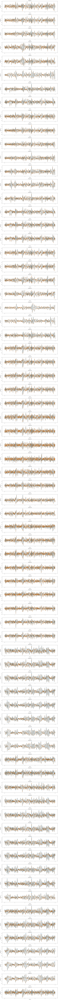

In [57]:
n_channels = real.shape[-1]
plt.figure(figsize = (20, 5 * n_channels))
n_steps = 5000
plt.subplots_adjust(hspace = 0.3)

for chan in range(real.shape[-1]):

    plt.subplot(n_channels, 1, chan + 1)
    plt.title(f'Channel {chan + 1}')
    plt.plot(
        np.linspace(0, n_steps / fs, n_steps * p_out), 
        real[:n_steps, :, chan].flatten(), 
        linewidth = 3
    )
    plt.plot(
        np.linspace(0, n_steps / fs, n_steps * p_out), 
        pred[:n_steps, :, chan].flatten(), 
        linewidth = 1
    )
    plt.xlabel('Time [s]')
    plt.ylabel('Voltage [V]')
    
plt.show()